<a href="https://colab.research.google.com/github/lblogan14/bayes_methods_for_hackers/blob/main/ch5_decision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Chapter 5. Would You Rather Lose an Arm or a Leg?

In [1]:
!pip install pymc

     |████████████████████████████████| 389kB 2.6MB/s 
  Created wheel for pymc: filename=pymc-2.3.8-cp36-cp36m-linux_x86_64.whl size=1275942 sha256=a5bdec0448e19a15ae63987ec57ecbcc9ce7b3955574ad55345fb0614fcf4a75
  Stored in directory: /root/.cache/pip/wheels/0b/a8/e7/8f3ba91a39294d538a92db052fd1fcba1fca74a58c8b022026
Successfully built pymc


##Loss Functions
A **loss function** is a function of the true parameter, and an estimate of that parameter
$$L(\theta, \hat{\theta})=f(\theta, \hat{\theta})$$
The loss functions measure how bad the current estimate is.

A **squared-error loss** is used in estimators like linear regression, calculation of unbiased statistics, and many areas of machine learning:
$$L(\theta, \hat{\theta})=(\theta- \hat{\theta})^2$$
An **asymmetric squared-error loss** is
$$L(\theta, \hat{\theta})=\begin{cases}(\theta- \hat{\theta})^2 & \hat{\theta}<\theta\\
c(\theta- \hat{\theta})^2 & \hat{\theta}\geq\theta,\, 0<c<1
\end{cases}$$
which represents that estimating a value larger than the true estimate is preferable to estimating a value that is smaller.

An **absolute loss** increases linearly with the difference, often used in robust statistics:
$$L(\theta, \hat{\theta})=|\theta- \hat{\theta}|$$

A *zero-one loss* is often used in ML classification:
$$L(\theta, \hat{\theta})=\mathbf{1}_{\hat{\theta}\neq\theta}$$

A *log-loss* is
$$L(\theta, \hat{\theta})=-\hat{\theta}\log(\theta)-(1-\hat{\theta})\log(1-\theta),\quad \hat{\theta}\in 0,1,\,\theta\in[0,1]$$

###Loss Functions in the Real World


If $P(\theta|X)$ is the posterior distribution of $\theta$ after observing data $X$, then the *expected loss of choosing estimate $\hat{\theta}$ to estimate $\theta$* is
$$l(\hat{\theta})=E_{\theta}[L(\theta, \hat{\theta})]$$
This is also known as the *risk* of estimate $\hat{\theta}$.

Given $N$ samples $\theta_i$, $i=1,...,N$ from the posterior distribution, and a loss function $L$, then the expected loss of using estimate $\hat{\theta}$ can be approximated by the Law of Large Numbers:
$$\frac{1}{N}\sum^N_{i=1}L(\theta_i, \hat{\theta})\approx E_{\theta}[L(\theta, \hat{\theta})]=l(\hat{\theta})$$
Measuring the loss via an expected value uses more information from the distribution than the MAP estimate, which will only find the maximum value of the distribution and ignore the shape of the distribution.

###Example: Optimizing for the Showcase on The Price is Right
Rules:
1. Two contestants compete in the Showcase.
2. Each contestant is shown a unique suite of prizes
3. After the viewing, the contestants are asked to bid on the price for their unique suite of prizes.
4. If a bid price is over the actual price, the bid' owner is disquilified from winning.
5. If a bid price is under the true price by less than $250, the winner is awarded both prizes.

For simplicity, suppose the true price follows a Normal:
$$\text{True Price}\sim Normal(\mu_p, \sigma_p)$$
assume $\mu_p=35,000$ and $\sigma_p=7,500$.

We need a model of how we should be playing the Showcase. Let's suppose our beliefs about the prices of prizes also follow Normal distributions:
$$\text{Prize}_i\sim Normal(\mu_i,\sigma_i),\quad i=1,2$$
The true price of the prize suite is then given by $\text{Prize}_1+\text{Prize}_2+\epsilon$, where $\epsilon$ is an error term. Suppose the two prizes are
1. A trip to Toronto.
2. A new snowblower.

Then, the uncertainty of the guessed prices can be
$$\text{Toronto}\sim Normal(12000, 3000)$$
$$\text{Snowblower}\sim Normal(3000, 500)$$
If the true price of the trip to Toronto is $12,000, then there is a 68.2% chance that the price falls 1 standard deviation away from this; that is, the confidence is that there is a 68.2% chance the trip is in [9000, 15000].

In [2]:
%matplotlib inline
import scipy.stats as stats
from IPython.core.pylabtools import figsize
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['figure.dpi'] = 300

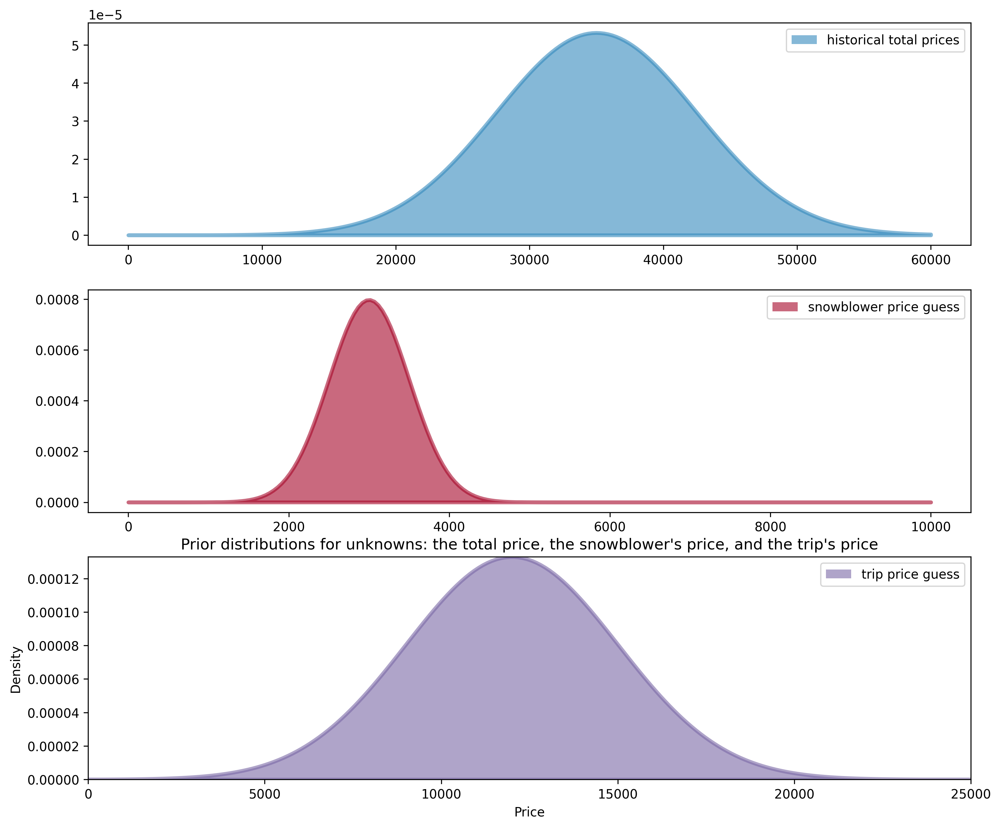

In [3]:
norm_pdf = stats.norm.pdf

figsize(12.5, 11)

plt.subplot(311)
x = np.linspace(0, 60000, 200)
sp1 = plt.fill_between(x, 0, norm_pdf(x, 35000, 7500),
                       color='#348ABD', lw=3, alpha=0.6,
                       label='historical total prices')
p1 = plt.Rectangle(xy=(0,0), width=1, height=1, 
                   fc=sp1.get_facecolor()[0])
plt.legend([p1], [sp1.get_label()])

plt.subplot(312)
x = np.linspace(0, 10000, 200)
sp2 = plt.fill_between(x, 0, norm_pdf(x, 3000, 500),
                       color='#A60628', lw=3, alpha=0.6,
                       label='snowblower price guess')
p2 = plt.Rectangle(xy=(0,0), width=1, height=1,
                   fc=sp2.get_facecolor()[0])
plt.legend([p2], [sp2.get_label()])

plt.subplot(313)
x = np.linspace(0, 25000, 200)
sp3 = plt.fill_between(x, 0, norm_pdf(x, 12000, 3000),
                       color='#7A68A6', lw=3, alpha=0.6,
                       label='trip price guess')
plt.autoscale(tight=True)
p3 = plt.Rectangle(xy=(0,0), width=1, height=1,
                   fc=sp3.get_facecolor()[0])
plt.title('Prior distributions for unknowns: the total price, the snowblower\'s price, and the trip\'s price')
plt.legend([p3], [sp3.get_label()])
plt.xlabel('Price')
plt.ylabel('Density');

In [4]:
import pymc as pm

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [5]:
data_mu = [3e3, 12e3]
data_std = [5e2, 3e3]

mu_prior = 35e3
std_prior = 75e2

true_price = pm.Normal('true_price', mu_prior, 1.0/std_prior **2)

prize_1 = pm.Normal('first_prize', data_mu[0], 1.0/data_std[0] **2)
prize_2 = pm.Normal('second_prize', data_mu[1], 1.0/data_std[1] **2)
price_estimate = prize_1 + prize_2

@pm.potential
def error(true_price=true_price, price_estimate=price_estimate):
    return pm.normal_like(true_price, price_estimate, 1/(3e3)**2)

In [6]:
mcmc = pm.MCMC([true_price, prize_1, prize_2, price_estimate, error])
mcmc.sample(50000, 10000)
price_trace = mcmc.trace('true_price')[:]

 [-----------------100%-----------------] 50000 of 50000 complete in 4.7 sec

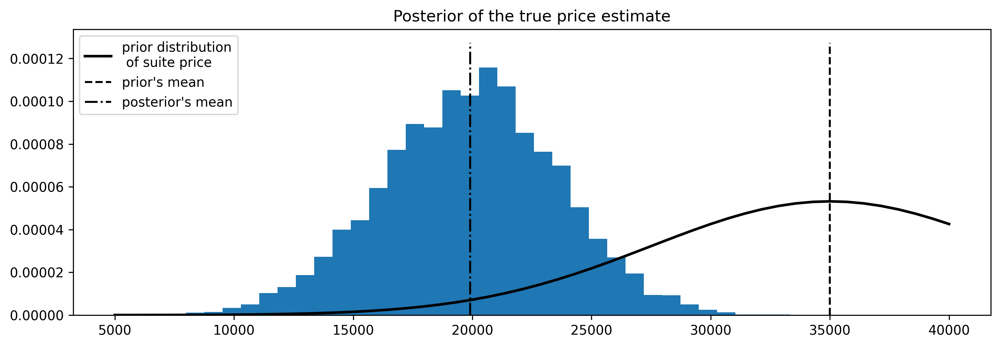

In [7]:
figsize(12.5, 4)

# Plot the prior distribution
x = np.linspace(5000, 40000)
plt.plot(x, stats.norm.pdf(x, 35000, 7500), c='k', lw=2,
         label='prior distribution\n of suite price')

# Plot the posterior distribution, represented by samples from the MCMC
_hist = plt.hist(price_trace, bins=35, density=True, histtype='stepfilled')
plt.title('Posterior of the true price estimate')
plt.vlines(mu_prior, 0, 1.1*np.max(_hist[0]), label='prior\'s mean',
           linestyles='--')
plt.vlines(price_trace.mean(), 0, 1.1*np.max(_hist[0]),
           label='posterior\'s mean', linestyles='-.')
plt.legend(loc='upper left');

The contestant's loss function may have a `risk` parameter that defines how bad it is if our guess is over the true price. A lower `risk` means that we are more comfortable with the idea of going over.

For every possible bid, calculate the *expected loss* associated with that bid. We can vary the `risk` parameter to see how it affects our loss:

In [8]:
def showdown_loss(guess, true_price, risk=80000):
    loss = np.zeros_like(true_price)
    ix = true_price < guess
    loss[~ix] = np.abs(guess - true_price[~ix])
    close_mask = [np.abs(true_price - guess) <= 250]
    loss[close_mask] = -2 * true_price[close_mask]
    loss[ix] = risk
    return loss

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a diff

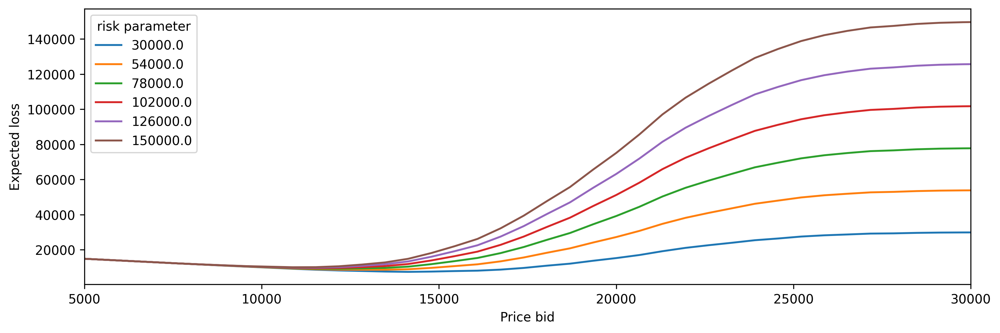

In [9]:
guesses = np.linspace(5000, 50000, 70)
risks = np.linspace(30000, 150000, 6)
expected_loss = lambda guess, risk: showdown_loss(guess, price_trace, risk).mean()

for _p in risks:
    results = [expected_loss(_g, _p) for _g in guesses]
    plt.plot(guesses, results, label='{}'.format(_p))
plt.legend(loc='upper left', title='risk parameter')
plt.xlabel('Price bid')
plt.ylabel('Expected loss')
plt.xlim(5000, 30000);

**Minimizing the losses**: minimize the expected loss by finding the solution to
$$\arg\min_{\hat{\theta}}E_{\theta}[L(\theta, \hat{\theta})]$$

The minimum of the expected loss is called the *Bayes action*, and can be solved using Scipy's optimization routines.

In [10]:
import scipy.optimize as sop

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  


minimum at risk 30000.0: 14021.20
minimum at risk 54000.0: 13126.69
minimum at risk 78000.0: 12213.80


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a diff

minimum at risk 102000.0: 11406.33
minimum at risk 126000.0: 11406.33
minimum at risk 150000.0: 10881.12


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  


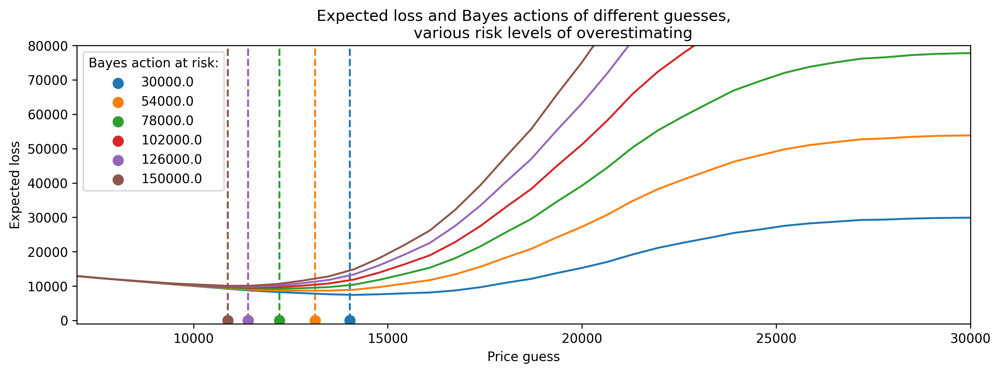

In [11]:
ax = plt.subplot(111)
for _p in risks:
    _color = next(ax._get_lines.prop_cycler)
    _min_results = sop.fmin(func=expected_loss,
                            x0=15000,
                            args=(_p,),
                            disp=False)
    _results = [expected_loss(_g, _p) for _g in guesses]
    plt.plot(guesses, _results, color=_color['color'])
    plt.scatter(_min_results,0, s=60, color=_color['color'], label='{}'.format(_p))
    plt.vlines(_min_results, 0, 120000, color=_color['color'], linestyles='--')
    print('minimum at risk {0}: {1:.2f}'.format(_p, _min_results[0]))

plt.title('Expected loss and Bayes actions of different guesses,\n\
            various risk levels of overestimating')
plt.legend(loc='upper left', scatterpoints=1, title='Bayes action at risk:')
plt.xlabel('Price guess')
plt.ylabel('Expected loss')
plt.xlim(7000, 30000)
plt.ylim(-1000, 80000);

As the risk threshold (care about overbidding less) is decreased, our bid is increased, willing to edge closer to the trur price.

##Machine Learning via Bayesian Methods
Finding Bayes actions is equivalent to finding parameters that optimize not *parameter accuracy* but an *arbitrary performance measure*.

###Example: Financial Prediction
Suppose the future return of a stock price is very small (1%). The stock loss can be defined as below


In [12]:
def stock_loss(true_return, yhat, alpha=100.):
    if true_return * yhat < 0:
        # opposite signs, not good
        return alpha*yhat**2 - np.sign(true_return)*yhat + np.abs(true_return)
    else:
        return np.abs(true_return - yhat)

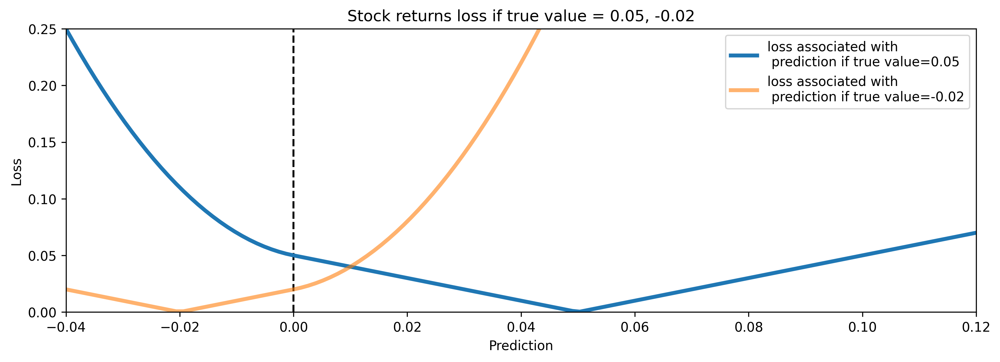

In [13]:
figsize(12.5, 4)

true_value = 0.05
pred = np.linspace(-0.04, 0.12, 125)

plt.plot(pred, [stock_loss(true_value, _p) for _p in pred],
         label='loss associated with\n prediction if true value=0.05', lw=3)
plt.vlines(0, 0, 0.25, linestyles='--')
plt.xlabel('Prediction')
plt.ylabel('Loss')
plt.xlim(-0.04, 0.12)
plt.ylim(0, 0.25)

true_value = -0.02
plt.plot(pred, [stock_loss(true_value, _p) for _p in pred], alpha=0.6,
         label='loss associated with\n prediction if true value=-0.02', lw=3)
plt.legend()
plt.title('Stock returns loss if true value = 0.05, -0.02');

*Downside risk* is prediction on the wrong side; *upside risk* is prediction on the right side. Both are seen as risky behavior and are discouraged.

For an artificial dataset, perform a regression on a trading signal predicting future returns well:

In [14]:
# code to create artificial data
N = 100
X = 0.025 * np.random.randn(N)
Y = 0.5 * X + 0.01 * np.random.rand(N)

ls_coef_ = np.cov(X, Y)[0,1]/np.var(X)
ls_intercept = Y.mean() - ls_coef_ * X.mean()

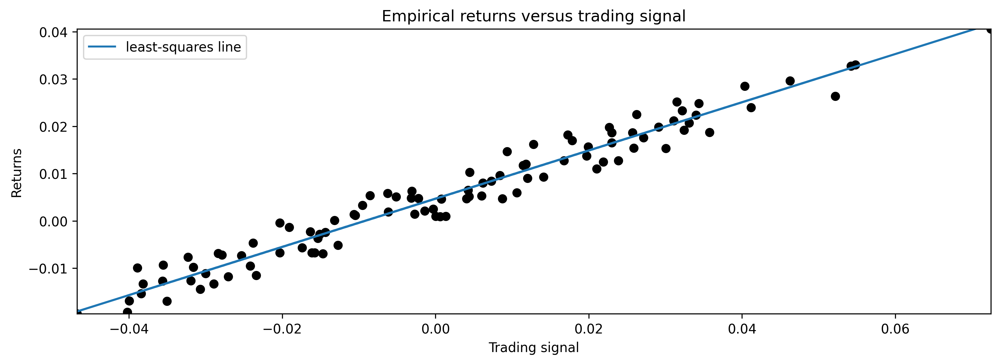

In [15]:
plt.scatter(X, Y, c='k')
plt.xlabel('Trading signal')
plt.ylabel('Returns')
plt.title('Empirical returns versus trading signal')
plt.plot(X, ls_coef_ * X + ls_intercept,
         label='least-squares line')
plt.xlim(X.min(), X.max())
plt.ylim(Y.min(), Y.max())
plt.legend(loc='upper left');

Perform a simple Bayesian linear regression on this dataset and model as
$$R = \alpha + \beta x + \epsilon$$
where $\alpha$, $\beta$ are unknown parameters and $\epsilon\sim Normal(0, 1/\tau)$. The most common priors on $\alpha$ and $\beta$ are Normal priors. Assign a prior on $\tau$ so that $\sigma=1/\sqrt{\tau}$ is uniform over 0 to 100 (equivalently, $\tau=1/Uniform(0,100)^2$ ).

In [16]:
from scipy.optimize import fmin
from pymc.Matplot import plot as mcplot

In [17]:
std = pm.Uniform('std', 0, 100, trace=False)

@pm.deterministic
def prec(U=std):
    return 1.0/ U**2

beta = pm.Normal('beta', 0, 0.0001)
alpha = pm.Normal('alpha', 0, 0.0001)

@pm.deterministic
def mean(X=X, alpha=alpha, beta=beta):
    return alpha + beta * X

In [18]:
obs = pm.Normal('obs', mean, prec, value=Y, observed=True)
mcmc = pm.MCMC([obs, beta, alpha, std, prec])

mcmc.sample(100000, 80000)

 [-----------------100%-----------------] 100000 of 100000 complete in 10.0 sec

Plotting prec
Plotting alpha
Plotting beta


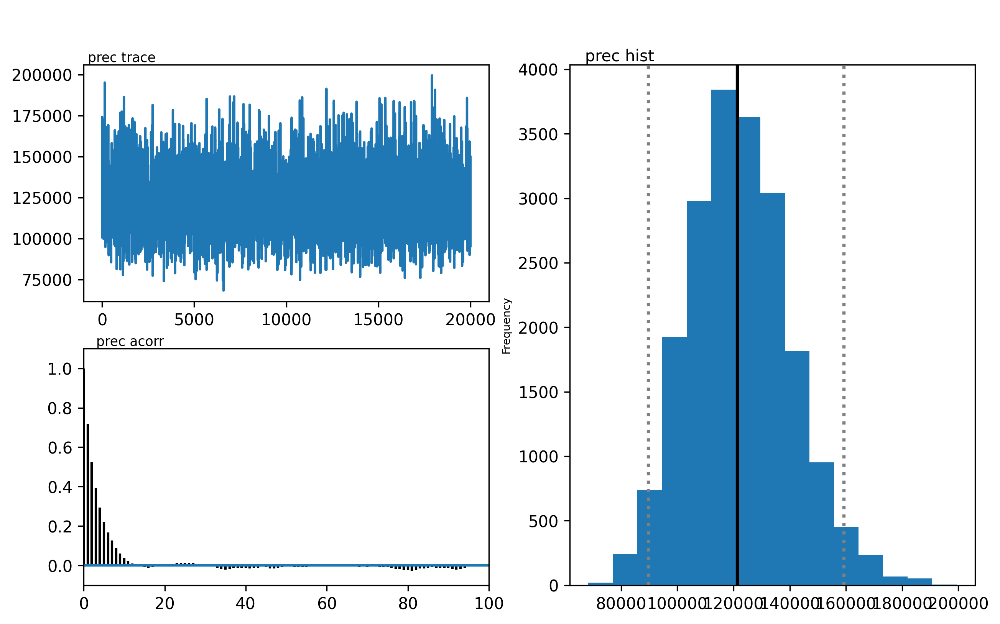

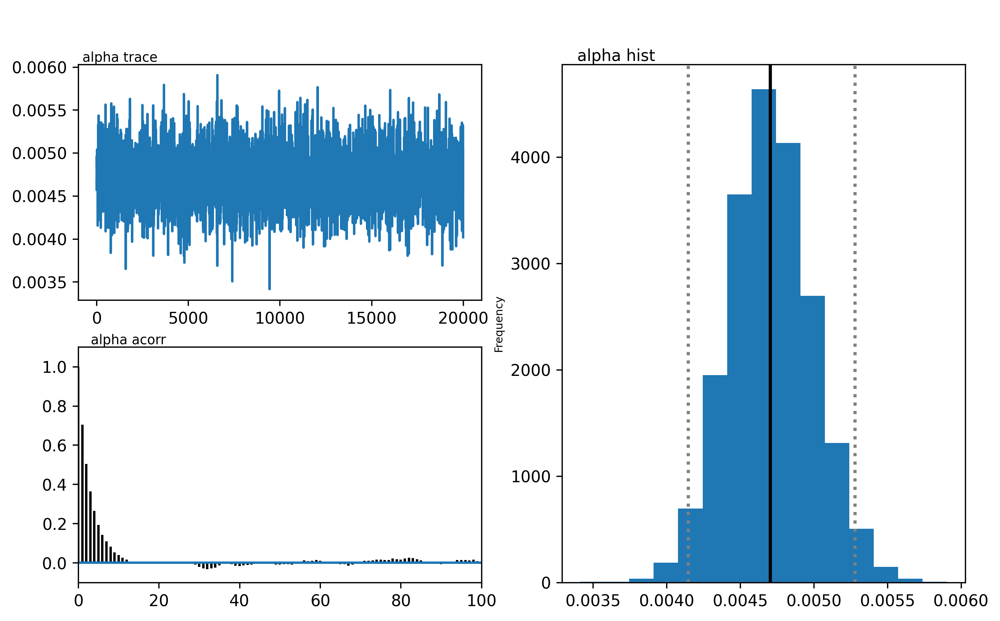

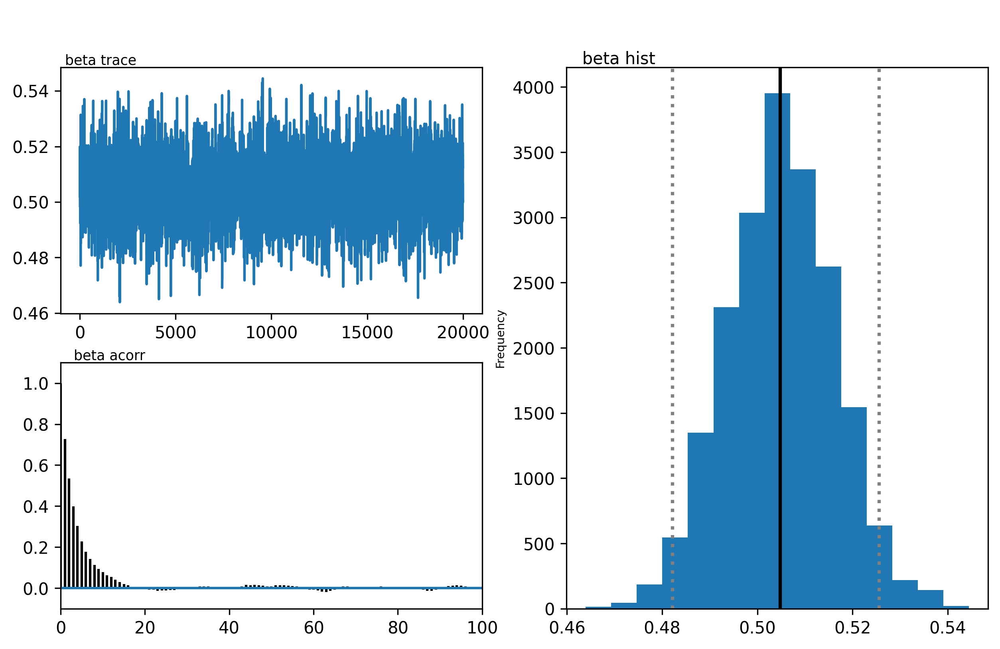

In [19]:
mcplot(mcmc)

For a specific trading signal, $x$, the distribution of possible returns has the form
$$R_i(x)=\alpha_i + \beta_i x + \epsilon$$
where $\epsilon\sim Normal(0, 1/\tau_i)$ and $i$ indexes the posterior samples.

Wish to find the solution to
$$\arg\min_r E_{R(x)}[L(R(x), r)]$$
where $r$ is the Bayes action for trading signal $x$/

In [20]:
def stock_loss(price, pred, coef=500):
    sol = np.zeros_like(price)
    ix = price*pred <0
    sol[ix] = coef*pred**2 - np.sign(price[ix]) * pred + np.abs(price[ix])
    sol[~ix] = np.abs(price[~ix] - pred)
    return sol

tau_samples = mcmc.trace('prec')[:]
alpha_samples = mcmc.trace('alpha')[:]
beta_samples = mcmc.trace('beta')[:]

N = tau_samples.shape[0]
noise = 1. / np.sqrt(tau_samples) * np.random.randn(N)

possible_outcomes = lambda signal: alpha_samples + beta_samples * signal + noise

opt_predictions = np.zeros(50)
trading_signals = np.linspace(X.min(), X.max(), 50)
for i, _signal in enumerate(trading_signals):
    _possible_outcomes = possible_outcomes(_signal)
    tomin = lambda pred: stock_loss(_possible_outcomes, pred).mean()
    opt_predictions[i] = fmin(tomin, 0, disp=False)

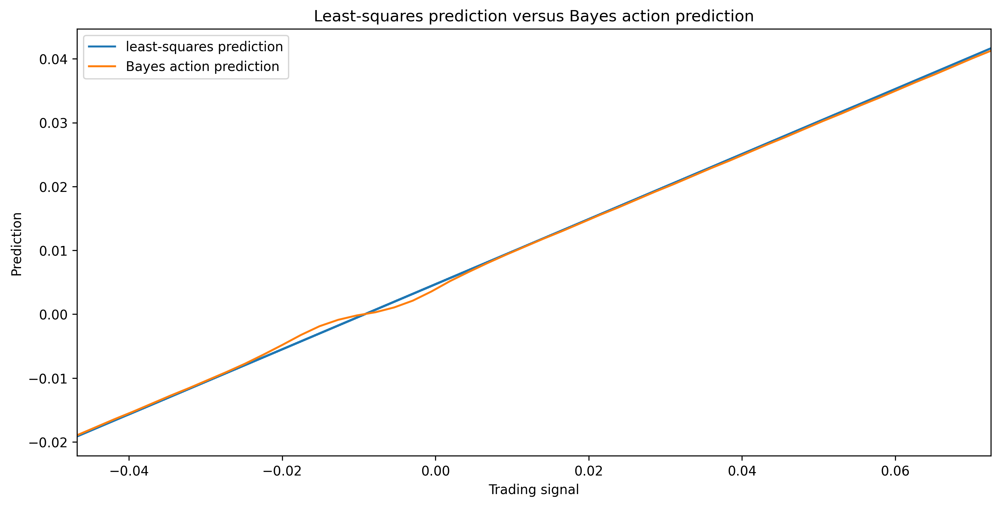

In [21]:
figsize(12.5, 6)
plt.xlabel('Trading signal')
plt.ylabel('Prediction')
plt.title('Least-squares prediction versus Bayes action prediction')
plt.plot(X, ls_coef_ * X + ls_intercept,
         label='least-squares prediction')
plt.xlim(X.min(), X.max())
plt.plot(trading_signals, opt_predictions,
         label='Bayes action prediction')
plt.legend(loc='upper left');

###Example: Kaggle Contest on Observing Dark Worlds
The contest required predictions about where dark matter was likely to be.

In [22]:
from matplotlib.patches import Ellipse

def draw_sky(galaxies):
    size_multipler = 45
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111, aspect='equal')
    n = galaxies.shape[0]
    for i in range(n):
        _g = galaxies[i,:]
        x,y = _g[0], _g[1]
        d = np.sqrt(_g[2]**2 + _g[3]**2)
        a = 1.0/(1-d)
        b = 1.0/(1+d)
        theta = np.degrees(np.arctan2(_g[3], _g[2])*0.5)

        ax.add_patch(Ellipse(xy=(x,y),
                             width=size_multipler*a,
                             height=size_multipler*b,
                             angle=theta)
        )
    ax.autoscale_view(tight=True)

    return fig

In [24]:
import pandas as pd
n_sky = 3 #choose a file/sky to examin
# pandas.read_csv requires raw content from github url
data_folder = 'https://raw.githubusercontent.com/CamDavidsonPilon/Probabilistic-Programming-and-Bayesian-Methods-for-Hackers/master/Chapter5_LossFunctions/data/Train_Skies/Train_Skies/'
data_file = 'Training_Sky{}.csv'.format(n_sky)
data_url = data_folder + data_file
c = pd.read_csv(data_url)
data = c.to_numpy()[:, 1:]
print('Data on galaxies in sky {}'.format(n_sky))
print('position_x, position_y, e_1, e_2')
print(data)

Data on galaxies in sky 3
position_x, position_y, e_1, e_2
[[162.69 1600.06 0.11466400000000002 -0.190326]
 [2272.28 540.04 0.623555 0.214979]
 [3553.64 2697.71 0.283527 -0.30186999999999997]
 ...
 [264.31 4083.7 -0.054652 -0.132625]
 [2041.51 27.47 0.183054 -0.399102]
 [840.08 532.86 -0.12147100000000001 -0.36885100000000004]]


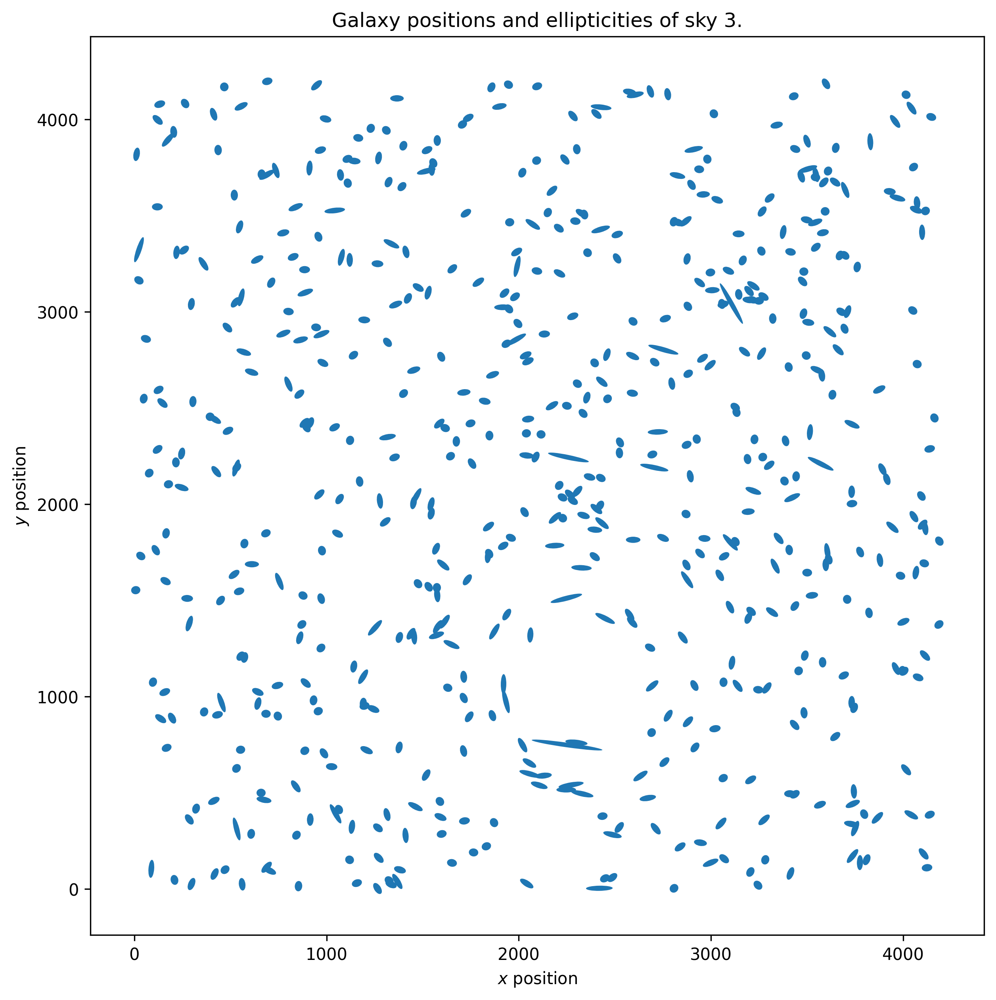

In [25]:
fig = draw_sky(data)
plt.title('Galaxy positions and ellipticities of sky {}.'.format(n_sky))
plt.xlabel('$x$ position')
plt.ylabel('$y$ position');

Each sky has one, two, or three dark matter halos in it. Assume the prior distribution of halo positions was uniform:
$$x_i\sim Uniform(0,4200)$$
$$y_i\sim Uniform(0,4200),\quad i=1,2,3$$

Looking around different dataset, we can assume that larger halos, having more mass, will influcence the surrounding galaxies more. Thus, it may be safe to assume the large halos would have a mass distributed as a *log*-uniform random variable between 40 and 180:
$$m_{\text{large}}=\log Uniform(40,180)$$

In [26]:
exp_mass_large = pm.Uniform('exp_mass_large', 40, 180)

@pm.deterministic
def mass_large(u=exp_mass_large):
    return np.log(u)

Next, assume that the ellipticity of each galaxy is dependent on the position of the halos, the distance between the galaxy and halo, and the mass of the halos. The vector of ellipticity of each galaxy, $\mathbf{e}_i$, are *children* variables of the vector of halo positions $\mathbf{(x,y)}$, distance, and halo masses.

Suppose that the ellipticity is related to positions by:
$$e_i|\mathbf{(x,y)}\sim Normal(\sum_{j=\text{halo positions}}d_{i,j} m_j f(r_{i,j}),\sigma^2$$
where $d_{i,j}$ is the *tangential direction* (the direction in which halo $j$ bends the light of galaxy $i$), $m_j$ is the mass of halo $j$, and $f(r_{i,j})$ is a *decreasing function* of the Euclidean distance between halo $j$ and galaxy $i$. The function $f$ for large halos was defined as
$$f(r_{i,j})=\frac{1}{\min(r_{i,j},240)}$$
for small halos,
$$f(r_{i,j})=\frac{1}{\min(r_{i,j},70)}$$

For each sky, run Bayesian model to find the posteriors for the halo positions and ignore the (known) halo position.

In [27]:
def euclidean_distance(x, y):
    return np.sqrt(((x - y)**2).sum(axis=1))

def f_distance(gxy_pos, halo_pos, c):
    # position should be a 2D numpy array
    return np.maximum(euclidean_distance(gxy_pos, halo_pos), c)[:, None]

def tangential_distance(glxy_position, halo_position):
    # position should be a 2D numpy array
    delta = glxy_position - halo_position
    t = (2*np.arctan(delta[:,1]/delta[:,0]))[:, None]
    return np.concatenate([-np.cos(t), -np.sin(t)], axis=1)

# set the size of the halo's mass
#mass_large = np.log(pm.Uniform('mass_large', 40, 180, trace=False).value)

# set the initial prior position of the halos; it is a 2D Uniform distribution
halo_position = pm.Uniform('halo_position', 0, 4200, size=(1,2))

@pm.deterministic
def mean(mass=exp_mass_large, h_pos=halo_position.value, glx_pos=data[:,:2].astype(float)):
    return mass/f_distance(glx_pos, h_pos, 240)* tangential_distance(glx_pos, h_pos)

ellpty = pm.Normal('ellipticity', mean, 1./0.05, 
                   observed=True,
                   value=data[:, 2:])

In [28]:
mcmc = pm.MCMC([ellpty, mean, halo_position, exp_mass_large])
map_ = pm.MAP([ellpty, mean, halo_position, exp_mass_large])
map_.fit()
mcmc.sample(200000, 140000, 3)
t = mcmc.trace('halo_position')[:].reshape(20000, 2)

 [-----------------100%-----------------] 200000 of 200000 complete in 30.3 sec

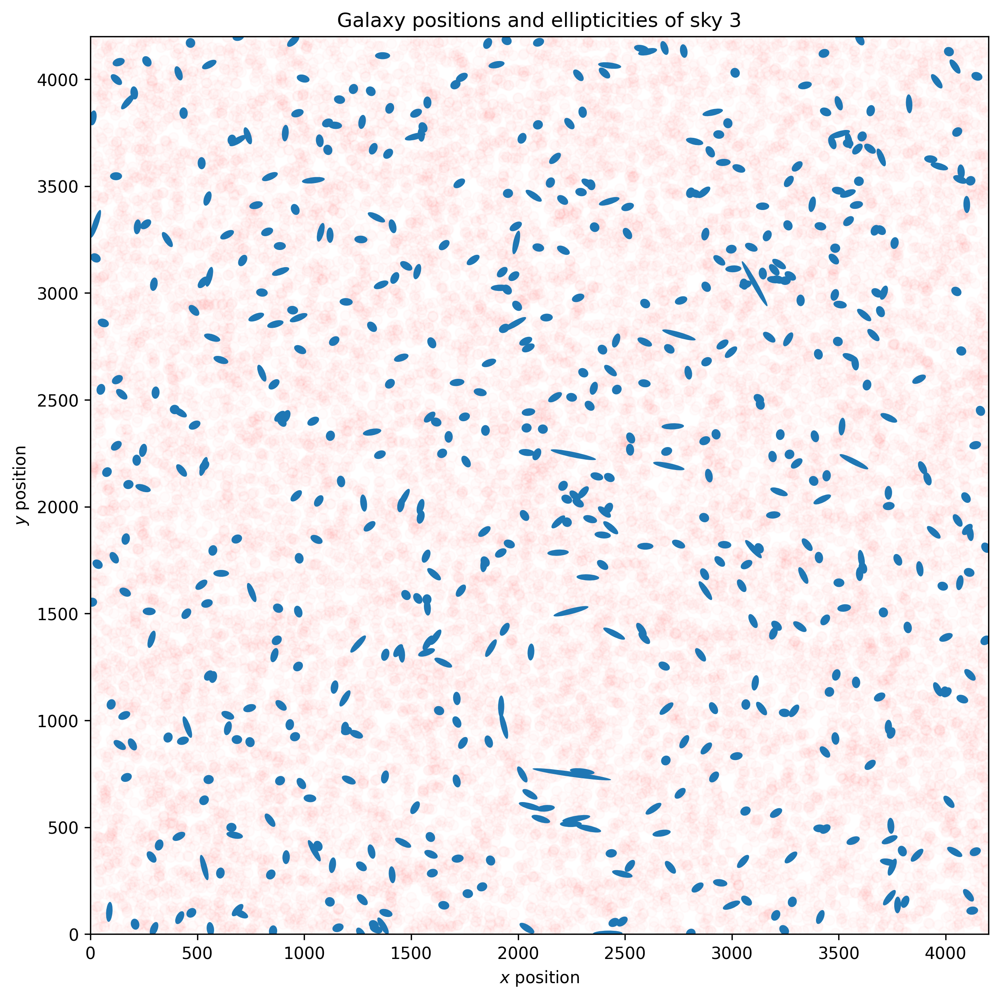

In [29]:
fig = draw_sky(data)
plt.title('Galaxy positions and ellipticities of sky {}'.format(n_sky))
plt.xlabel('$x$ position')
plt.ylabel('$y$ position')
plt.scatter(t[:,0], t[:,1], alpha=0.015, c='r')
plt.xlim(0, 4200)
plt.ylim(0, 4200);

In [33]:
halo_data = pd.read_csv('https://raw.githubusercontent.com/CamDavidsonPilon/Probabilistic-Programming-and-Bayesian-Methods-for-Hackers/master/Chapter5_LossFunctions/data/Training_halos.csv').to_numpy()[:,1:]
print(halo_data[n_sky])

[1 1408.61 1685.86 1408.61 1685.86 0.0 0.0 0.0 0.0]


The 3rd and 4th column represent the true $x$ and $y$ position of the halo.

True halo location: 1408.61 1685.86


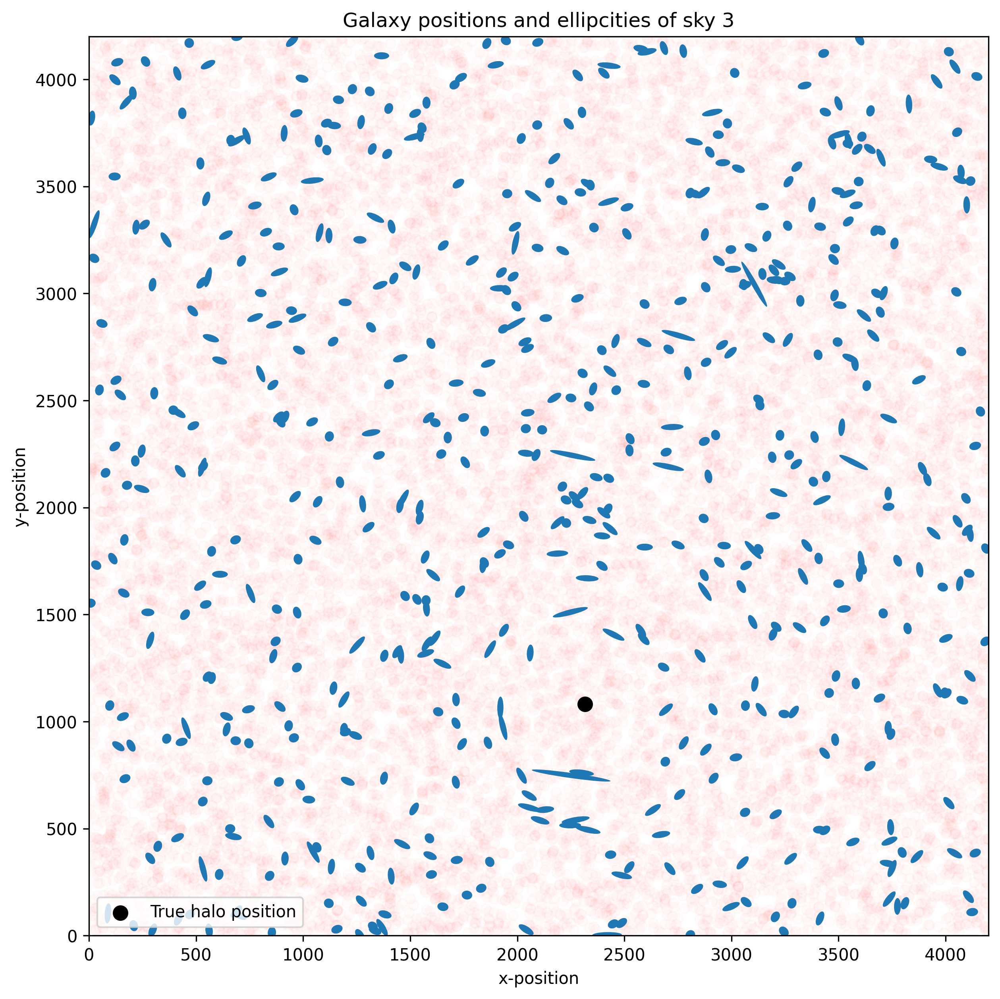

In [36]:
fig = draw_sky(data)
plt.title('Galaxy positions and ellipcities of sky {}'.format(n_sky))
plt.xlabel('x-position')
plt.ylabel('y-position')
plt.scatter(t[:,0], t[:,1], alpha=0.015, c='r')
plt.scatter(halo_data[n_sky-1][3], halo_data[n_sky-1][4],
            label='True halo position', c='k', s=70)
plt.legend(scatterpoints=1, loc='lower left')
plt.xlim(0, 4200)
plt.ylim(0, 4200);
print('True halo location:', halo_data[n_sky][3], halo_data[n_sky][4])

Use the loss function to optimize the location. A naive strategy would be to simply choose the mean:

In [37]:
mean_posterior = t.mean(axis=0).reshape(1,2)
print(mean_posterior)

[[2098.24594058 2092.79514496]]


In [38]:
import numpy as np
import math as mt
import itertools as it
import csv as c
import getopt as gt
import sys as sys
import argparse as ap
import string as st
import random as rd

def calc_delta_r(x_predicted,y_predicted,x_true,y_true): 
    """ Compute the scalar distance between predicted halo centers
    and the true halo centers. Predictions are matched to the closest
    halo center.
    Notes: It takes in the predicted and true positions, and then loops over each possible configuration and finds the most optimal one.
    Arguments:
        x_predicted, y_predicted: vector for predicted x- and y-positions (1 to 3 elements)
        x_true, y_true: vector for known x- and y-positions (1 to 3 elements)
    Returns:
        radial_distance: vector containing the scalar distances between the predicted halo centres and the true halo centres (1 to 3 elements)
        true_halo_idexes: vector containing indexes of the input true halos which matches the predicted halo indexes (1 to 3 elements)
        measured_halo_indexes: vector containing indexes of the predicted halo position with the  reference to the true halo position.
       e.g if true_halo_indexes=[0,1] and measured_halo_indexes=[1,0] then the first x,y coordinates of the true halo position matches the second input of the predicted x,y coordinates.
    """
    
    num_halos=len(x_true) #Only works for number of halos > 1
    num_configurations=mt.factorial(num_halos) #The number of possible different comb
    configurations=np.zeros([num_halos,num_configurations],int) #The array of combinations
                                                                #I will pass back
    distances = np.zeros([num_configurations],float) #The array of the distances
                                                     #for all possible combinations
    
    radial_distance=[]  #The vector of distances
                        #I will pass back
    
    #Pick a combination of true and predicted 
    a=['01','012'] #Input for the permutatiosn, 01 number halos or 012
    count=0 #For the index of the distances array
    true_halo_indexes=[] #The tuples which will show the order of halos picked
    predicted_halo_indexes=[]
    distances_perm=np.zeros([num_configurations,num_halos],float) #The distance between each
                                                                  #true and predicted
                                                                  #halo for every comb
    true_halo_indexes_perm=[] #log of all the permutations of true halos used
    predicted_halo_indexes_perm=[] #log of all the predicted permutations
    
    for  perm in it.permutations(a[num_halos-2],num_halos):
        which_true_halos=[]
        which_predicted_halos=[]
        for j in range(num_halos): #loop through all the true halos with the

            distances_perm[count,j]=np.sqrt((x_true[j]-x_predicted[int(perm[j])])**2\
                                      +(y_true[j]-y_predicted[int(perm[j])])**2)
                                      #This array logs the distance between true and
                                      #predicted halo for ALL configurations
                                      
            which_true_halos.append(j) #log the order in which I try each true halo
            which_predicted_halos.append(int(perm[j])) #log the order in which I true
                                                       #each predicted halo
        true_halo_indexes_perm.append(which_true_halos) #this is a tuple of tuples of
                                                        #all of thifferent config
                                                        #true halo indexes
        predicted_halo_indexes_perm.append(which_predicted_halos)
        
        distances[count]=sum(distances_perm[count,0::]) #Find what the total distances
                                                        #are for each configuration
        count=count+1

    config = np.where(distances == min(distances))[0][0] #The configuration used is the one
                                                         #which has the smallest distance
    radial_distance.append(distances_perm[config,0::]) #Find the tuple of distances that
                                                       #correspond to this smallest distance
    true_halo_indexes=true_halo_indexes_perm[config] #Find the tuple of the index which refers
                                                     #to the smallest distance
    predicted_halo_indexes=predicted_halo_indexes_perm[config]
            
    return radial_distance,true_halo_indexes,predicted_halo_indexes


def calc_theta(x_predicted, y_predicted, x_true, y_true, x_ref, y_ref):
    """ Calculate the angle the predicted position and the true position, where the zero degree corresponds to the line joing the true halo position and the reference point given.
    Arguments:
        x_predicted, y_predicted: vector for predicted x- and y-positions (1 to 3 elements)
        x_true, y_true: vector for known x- and y-positions (1 to 3 elements)
        Note that the input of these are matched up so that the first elements of each
        vector are associated with one another
        x_ref, y_ref: scalars of the x,y coordinate of reference point
    Returns:
        Theta: A vector containing the angles of the predicted halo w.r.t the true halo
        with the vector joining the reference point and the halo as the zero line. 
    """

    num_halos=len(x_predicted)
    theta=np.zeros([num_halos+1],float) #Set up the array which will pass back the values
    phi = np.zeros([num_halos],float)
    
    psi = np.arctan( (y_true-y_ref)/(x_true-x_ref) )

    
                     # Angle at which the halo is at
                                                     #with respect to the reference point
    phi[x_true != x_ref] = np.arctan((y_predicted[x_true != x_predicted]-\
                                      y_true[x_true != x_predicted])\
                    /(x_predicted[x_true != x_predicted]-\
                      x_true[x_true != x_predicted])) # Angle of the estimate
                                                               #wrt true halo centre

    #Before finding the angle with the zero line as the line joiing the halo and the reference
    #point I need to convert the angle produced by Python to an angle between 0 and 2pi
    phi =convert_to_360(phi, x_predicted-x_true,\
         y_predicted-y_true)
    psi = convert_to_360(psi, x_true-x_ref,\
                             y_true-y_ref)
    theta = phi-psi #The angle with the baseline as the line joing the ref and the halo

    
    theta[theta< 0.0]=theta[theta< 0.0]+2.0*mt.pi #If the angle of the true pos wrt the ref is
                                                  #greater than the angle of predicted pos
                                                  #and the true pos then add 2pi
    return theta


def convert_to_360(angle, x_in, y_in):
    """ Convert the given angle to the true angle in the range 0:2pi 
    Arguments:
        angle:
        x_in, y_in: the x and y coordinates used to determine the quartile
        the coordinate lies in so to add of pi or 2pi
    Returns:
        theta: the angle in the range 0:2pi
    """
    n = len(x_in)
    for i in range(n):
        if x_in[i] < 0 and y_in[i] > 0:
            angle[i] = angle[i]+mt.pi
        elif x_in[i] < 0 and y_in[i] < 0:
            angle[i] = angle[i]+mt.pi
        elif x_in[i] > 0 and y_in[i] < 0:
            angle[i] = angle[i]+2.0*mt.pi
        elif x_in[i] == 0 and y_in[i] == 0:
            angle[i] = 0
        elif x_in[i] == 0 and y_in[i] > 0:
            angle[i] = mt.pi/2.
        elif x_in[i] < 0 and y_in[i] == 0:
            angle[i] = mt.pi
        elif x_in[i] == 0 and y_in[i] < 0:
            angle[i] = 3.*mt.pi/2.



    return angle

def get_ref(x_halo,y_halo,weight):
    """ Gets the reference point of the system of halos by weighted averaging the x and y
    coordinates.
    Arguments:
         x_halo, y_halo: Vector num_halos referring to the coordinates of the halos
         weight: the weight which will be assigned to the position of the halo
         num_halos: number of halos in the system
    Returns:
         x_ref, y_ref: The coordinates of the reference point for the metric
    """
 

        #Find the weighted average of the x and y coordinates
    x_ref = np.sum([x_halo*weight])/np.sum([weight])
    y_ref = np.sum([y_halo*weight])/np.sum([weight])


    return x_ref,y_ref

    
def main_score( nhalo_all, x_true_all, y_true_all, x_ref_all, y_ref_all, sky_prediction):
    """abstracts the score from the old command-line interface. 
       sky_prediction is a dx2 array of predicted x,y positions
    
    -camdp"""
    
    r=np.array([],dtype=float) # The array which I will log all the calculated radial distances
    angle=np.array([],dtype=float) #The array which I will log all the calculated angles
    #Load in the sky_ids from the true
    num_halos_total=0 #Keep track of how many halos are input into the metric

        

    for selectskyinsolutions, sky in enumerate(sky_prediction): #Loop through each line in result.csv and analyse each one


        nhalo=int(nhalo_all[selectskyinsolutions])#How many halos in the
                                                       #selected sky?
        x_true=x_true_all[selectskyinsolutions][0:nhalo]
        y_true=y_true_all[selectskyinsolutions][0:nhalo]
                    
        x_predicted=np.array([],dtype=float)
        y_predicted=np.array([],dtype=float)
        for i in range(nhalo):
            x_predicted=np.append(x_predicted,float(sky[0])) #get the predicted values
            y_predicted=np.append(y_predicted,float(sky[1]))
            #The solution file for the test data provides masses 
            #to calculate the centre of mass where as the Training_halo.csv
            #direct provides x_ref y_ref. So in the case of test data
            #we need to calculate the ref point from the masses using
            #Get_ref()
  
        x_ref=x_ref_all[selectskyinsolutions]
        y_ref=y_ref_all[selectskyinsolutions]

        num_halos_total=num_halos_total+nhalo


        #Single halo case, this needs to be separately calculated since
        #x_ref = x_true
        if nhalo == 1:
            #What is the radial distance between the true and predicted position
            r=np.append(r,np.sqrt( (x_predicted-x_true)**2 \
                                          + (y_predicted-y_true)**2)) 
            #What is the angle between the predicted position and true halo position
            if (x_predicted-x_true) != 0:
                psi = np.arctan((y_predicted-y_true)/(x_predicted-x_true))
            else: psi=0.
            theta = convert_to_360([psi], [x_predicted-x_true], [y_predicted-y_true])
            angle=np.append(angle,theta)

        
        else:        
            #r_index_index, contains the radial distances of the predicted to
            #true positions. These are found by matching up the true halos to
            #the predicted halos such that the average of all the radial distances
            #is optimal. it also contains indexes of the halos used which are used to
            #show which halo has been mathced to which.
            
            r_index_index = calc_delta_r(x_predicted, y_predicted, x_true, \
                                         y_true)
  
            r=np.append(r,r_index_index[0][0])
            halo_index= r_index_index[1] #The true halos indexes matched with the 
            predicted_index=r_index_index[2] #predicted halo index

            angle=np.append(angle,calc_theta\
                                  (x_predicted[predicted_index],\
                                   y_predicted[predicted_index],\
                                   x_true[halo_index],\
                                   y_true[halo_index],x_ref,\
                                   y_ref)) # Find the angles of the predicted
                                               #position wrt to the halo and
                                               # add to the vector angle

    
    # Find what the average distance the estimate is from the halo position
    av_r=sum(r)/len(r)
    
    #In order to quantify the orientation invariance we will express each angle 
    # as a vector and find the average vector
    #R_bar^2=(1/N Sum^Ncos(theta))^2+(1/N Sum^Nsin(theta))**2
    
    N = float(num_halos_total)
    angle_vec = np.sqrt(( 1.0/N * sum(np.cos(angle)) )**2 + \
        ( 1.0/N * sum(np.sin(angle)) )**2)
    
    W1=1./1000. #Weight the av_r such that < 1 is a good score > 1 is not so good.
    W2=1.
    metric = W1*av_r + W2*angle_vec #Weighted metric, weights TBD
    print('Your average distance in pixels you are away from the true halo is', av_r)
    print('Your average angular vector is', angle_vec)
    print('Your score for the training data is', metric)
    return metric
    
    
def main(user_fname, fname):
    """ Script to compute the evaluation metric for the Observing Dark Worlds competition. You can run it on your training data to understand how well you have done with the training data.
    """

    r=np.array([],dtype=float) # The array which I will log all the calculated radial distances
    angle=np.array([],dtype=float) #The array which I will log all the calculated angles
    #Load in the sky_ids from the true
    
    true_sky_id=[]
    sky_loader = c.reader(open(fname, 'rb')) #Load in the sky_ids from the solution file
    for row in sky_loader:
        true_sky_id.append(row[0])

    #Load in the true values from the solution file

    nhalo_all=np.loadtxt(fname,usecols=(1,),delimiter=',',skiprows=1)
    x_true_all=np.loadtxt(fname,usecols=(4,6,8),delimiter=',',skiprows=1)
    y_true_all=np.loadtxt(fname,usecols=(5,7,9),delimiter=',',skiprows=1)
    x_ref_all=np.loadtxt(fname,usecols=(2,),delimiter=',',skiprows=1)
    y_ref_all=np.loadtxt(fname,usecols=(3,),delimiter=',',skiprows=1)

    
    for row in sky_loader:
        true_sky_id.append(row[1])
        

    
    num_halos_total=0 #Keep track of how many halos are input into the metric


    sky_prediction = c.reader(open(user_fname, 'rb')) #Open the result.csv   
   
    try: #See if the input file from user has a header on it
         #with open('JoyceTest/trivialUnitTest_Pred.txt', 'r') as f:
        with open(user_fname, 'r') as f:   
            header = float((f.readline()).split(',')[1]) #try and make where the
                                                         #first input would be
                                                         #a float, if succeed it
                                                         #is not a header
        print('THE INPUT FILE DOES NOT APPEAR TO HAVE A HEADER')
    except :
        print('THE INPUT FILE APPEARS TO HAVE A HEADER, SKIPPING THE FIRST LINE')
        skip_header = sky_prediction.next()
        

    for sky in sky_prediction: #Loop through each line in result.csv and analyse each one
        sky_id = str(sky[0]) #Get the sky_id of the input
        does_it_exist=true_sky_id.count(sky_id) #Is the input sky_id
                                                #from user a real one?
        
        if does_it_exist > 0: #If it does then find the matching solutions to the sky_id
                            selectskyinsolutions=true_sky_id.index(sky_id)-1
        else: #Otherwise exit
            print('Sky_id does not exist, formatting problem: ',sky_id)
            sys.exit(2)


        nhalo=int(nhalo_all[selectskyinsolutions])#How many halos in the
                                                       #selected sky?
        x_true=x_true_all[selectskyinsolutions][0:nhalo]
        y_true=y_true_all[selectskyinsolutions][0:nhalo]
                    
        x_predicted=np.array([],dtype=float)
        y_predicted=np.array([],dtype=float)
        for i in range(nhalo):
            x_predicted=np.append(x_predicted,float(sky[2*i+1])) #get the predicted values
            y_predicted=np.append(y_predicted,float(sky[2*i+2]))
            #The solution file for the test data provides masses 
            #to calculate the centre of mass where as the Training_halo.csv
            #direct provides x_ref y_ref. So in the case of test data
            #we need to calculae the ref point from the masses using
            #Get_ref()
  
        x_ref=x_ref_all[selectskyinsolutions]
        y_ref=y_ref_all[selectskyinsolutions]

        num_halos_total=num_halos_total+nhalo


        #Single halo case, this needs to be separately calculated since
        #x_ref = x_true
        if nhalo == 1:
            #What is the radial distance between the true and predicted position
            r=np.append(r,np.sqrt( (x_predicted-x_true)**2 \
                                          + (y_predicted-y_true)**2)) 
            #What is the angle between the predicted position and true halo position
            if (x_predicted-x_true) != 0:
                psi = np.arctan((y_predicted-y_true)/(x_predicted-x_true))
            else: psi=0.
            theta = convert_to_360([psi], [x_predicted-x_true], [y_predicted-y_true])
            angle=np.append(angle,theta)

        
        else:        
            #r_index_index, contains the radial distances of the predicted to
            #true positions. These are found by matching up the true halos to
            #the predicted halos such that the average of all the radial distances
            #is optimal. it also contains indexes of the halos used which are used to
            #show which halo has been mathced to which.
            
            r_index_index = calc_delta_r(x_predicted, y_predicted, x_true, \
                                         y_true)
  
            r=np.append(r,r_index_index[0][0])
            halo_index= r_index_index[1] #The true halos indexes matched with the 
            predicted_index=r_index_index[2] #predicted halo index

            angle=np.append(angle,calc_theta\
                                  (x_predicted[predicted_index],\
                                   y_predicted[predicted_index],\
                                   x_true[halo_index],\
                                   y_true[halo_index],x_ref,\
                                   y_ref)) # Find the angles of the predicted
                                               #position wrt to the halo and
                                               # add to the vector angle

    
    # Find what the average distance the estimate is from the halo position
    av_r=sum(r)/len(r)
    
    #In order to quantify the orientation invariance we will express each angle 
    # as a vector and find the average vector
    #R_bar^2=(1/N Sum^Ncos(theta))^2+(1/N Sum^Nsin(theta))**2
    
    N = float(num_halos_total)
    angle_vec = np.sqrt(( 1.0/N * sum(np.cos(angle)) )**2 + \
        ( 1.0/N * sum(np.sin(angle)) )**2)
    
    W1=1./1000. #Weight the av_r such that < 1 is a good score > 1 is not so good.
    W2=1.
    metric = W1*av_r + W2*angle_vec #Weighted metric, weights TBD
    print('Your average distance in pixels you are away from the true halo is', av_r)
    print('Your average angular vector is', angle_vec)
    print('Your score for the training data is', metric)

In [48]:
_halo_data[]

2315.78

In [51]:
_halo_data = halo_data[n_sky-1]
nhalo_all = np.reshape(_halo_data[0], (1,1))
x_true_all = np.reshape(_halo_data[3], (1,1))
y_true_all = np.reshape(_halo_data[4], (1,1))
x_ref_all = np.reshape(_halo_data[1], (1,1))
y_ref_all = np.reshape(_halo_data[2], (1,1))
sky_prediction = mean_posterior

print("Using the mean:")
main_score(nhalo_all, x_true_all, y_true_all,
           x_ref_all, y_ref_all, sky_prediction)

print("\n")
# what's a bad score?
random_guess = np.random.randint(0, 4200, size=(1, 2))
print("Using a random location:", random_guess)
main_score(nhalo_all, x_true_all, y_true_all,
           x_ref_all, y_ref_all, random_guess)

Using the mean:
Your average distance in pixels you are away from the true halo is 1033.9869312950339
Your average angular vector is 1.0
Your score for the training data is 2.0339869312950336


Using a random location: [[ 537 3135]]
Your average distance in pixels you are away from the true halo is 2716.4448440746964
Your average angular vector is 1.0
Your score for the training data is 3.7164448440746964


3.7164448440746964

In [56]:
def halo_posterior(n_halos_in_sky, galaxy_data, samples=5e5, burn_in=34e4, thin=4):
    # set the size of the halo's mass
    mass_large = pm.Uniform('mass_large', 40, 180)

    mass_small_1 = 20
    mass_small_2 = 20

    masses = np.array([mass_large, mass_small_1, mass_small_2], dtype=object)

    # set the initial prior positions of the halos; it's a 2D Uniform distribution.
    halo_positions = pm.Uniform('halo_positions', 0, 4200, size=(n_halos_in_sky, 2))
    fdist_constants = np.array([240, 70, 70])

    @pm.deterministic
    def mean(mass=masses, h_pos=halo_positions, glx_pos=data[:,:2].astype(float), n_halos_in_sky=n_halos_in_sky):
        _sum = 0
        for i in range(n_halos_in_sky):
            _sum += mass[i] / f_distance(glx_pos, 
                                         h_pos[i, :],
                                         fdist_constants[i]) *\
                            tangential_distance(glx_pos, h_pos[i,:])
        
        return _sum

    ellpty = pm.Normal('ellipticity', mean, 1./0.05, observed=True, value=data[:,2:])
    map_ = pm.MAP([ellpty, mean, halo_positions, mass_large])
    map_.fit(method='fmin_powell')

    mcmc = pm.MCMC([ellpty, mean, halo_positions, mass_large])
    mcmc.sample(samples, burn_in, thin)
    return mcmc.trace('halo_positions')[:]

In [54]:
n_sky = 215
data_folder = 'https://raw.githubusercontent.com/CamDavidsonPilon/Probabilistic-Programming-and-Bayesian-Methods-for-Hackers/master/Chapter5_LossFunctions/data/Train_Skies/Train_Skies/'
data_file = 'Training_Sky{}.csv'.format(n_sky)
data_url = data_folder + data_file
c = pd.read_csv(data_url)
data = c.to_numpy()[:, 1:]

In [57]:
samples = 10.5e5
traces = halo_posterior(3, data, samples=samples,
                        burn_in=9.5e5, thin=10)

 [-----------------100%-----------------] 1050000 of 1050000 complete in 637.6 sec

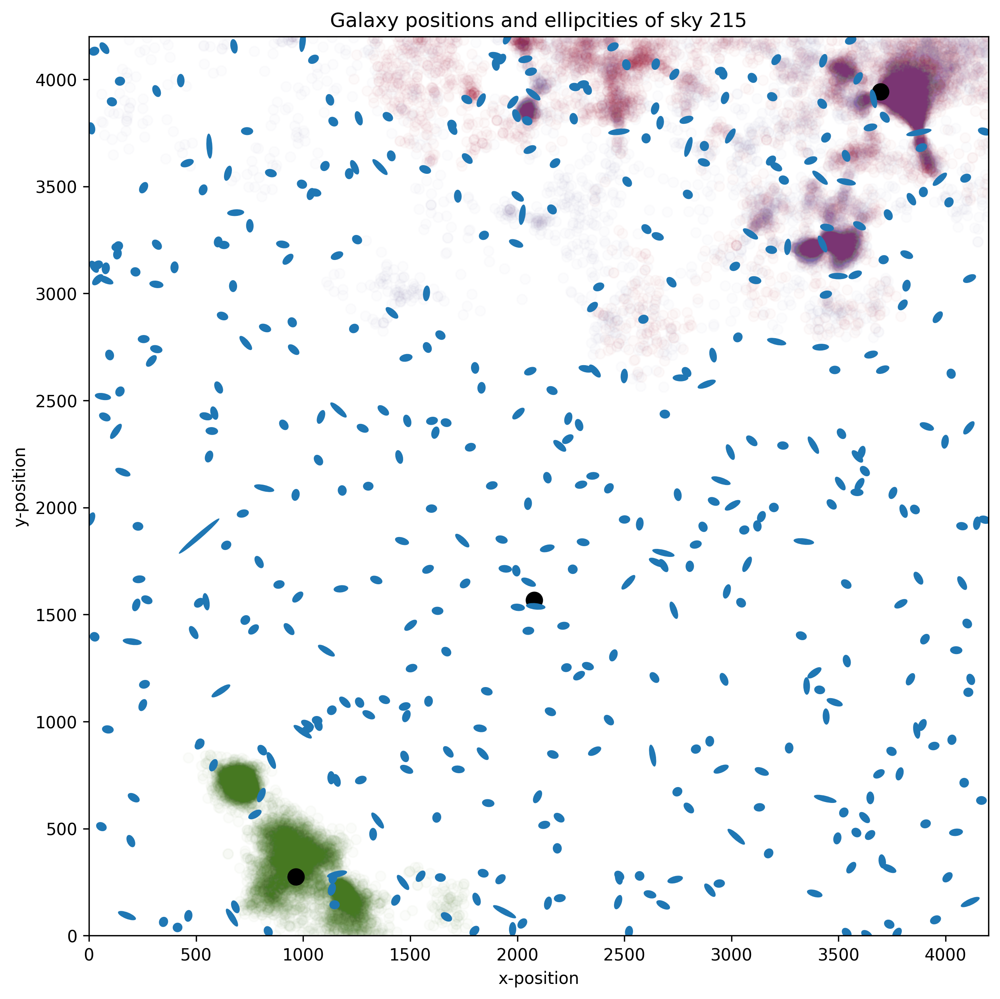

In [58]:
fig = draw_sky(data)
plt.title('Galaxy positions and ellipcities of sky {}'.format(n_sky))
plt.xlabel("x-position")
plt.ylabel("y-position")

colors = ["#467821", "#A60628", "#7A68A6"]

for i in range(traces.shape[1]):
    plt.scatter(traces[:, i, 0], traces[:, i, 1], c=colors[i], alpha=0.02)


for i in range(traces.shape[1]):
    plt.scatter(halo_data[n_sky - 1][3 + 2 * i], halo_data[n_sky - 1][4 + 2 * i],
                label="True halo position",
                c="k", s=90)

# plt.legend(scatterpoints = 1)
plt.xlim(0, 4200)
plt.ylim(0, 4200);

The optimization step would look like:

In [61]:
_halo_data = halo_data[n_sky-1]
print(traces.shape)

mean_posterior = traces.mean(axis=0).reshape(1,6)
print(mean_posterior)

nhalo_all = np.reshape(_halo_data[0], (1,1))
x_true_all = np.reshape(_halo_data[3], (1,1))
y_true_all = np.reshape(_halo_data[4], (1,1))
x_ref_all = np.reshape(_halo_data[1], (1,1))
y_ref_all = np.reshape(_halo_data[2], (1,1))
sky_prediction = mean_posterior

print("Using the mean:")
main_score([1], x_true_all, y_true_all,
           x_ref_all, y_ref_all, sky_prediction)

print("\n")
# what's a bad score?
random_guess = np.random.randint(0, 4200, size=(1, 2))
print("Using a random location:", random_guess)
main_score([1], x_true_all, y_true_all,
           x_ref_all, y_ref_all, random_guess)

(10000, 3, 2)
[[ 921.78224784  433.15440746 3375.17707441 3770.96717473 3373.59391704
  3621.42924871]]
Using the mean:
Your average distance in pixels you are away from the true halo is 4473.358197770051
Your average angular vector is 1.0
Your score for the training data is 5.473358197770051


Using a random location: [[1448 1302]]
Your average distance in pixels you are away from the true halo is 3467.742902018545
Your average angular vector is 1.0
Your score for the training data is 4.467742902018545


4.467742902018545